In [45]:
# Import necessary packages
import visualization.publications.ashrae_2021_s_conf.ashrae_2021_s_conf as ref
from config.appconfig import config
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd
import chart_studio
import plotly.io as pio
import plotly.express as px
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# Define local data
figure_index = 1
datetime_xaxis_label = "<b>Month, Year<b>"
pio.templates.default = "ggplot2"
plot_background_color = 'rgba(243, 243, 243, 1)'
media_directory = config.ROOT_MEDIA_DIR + config.ASHRAE_2021_S_CONF_IMAGE_DIR

# Initializing supporting class structure
start_date = datetime(2020, 11, 27)
end_date = datetime(2020, 12, 7)

conf_ref = ref.ASHRAE2021SummerConf()
conf_ref.clear_media_dir()
conf_ref.load_data(start_date, end_date)


In [46]:
# Plot the measured UV index against the darksky API
pio.templates.default = 'seaborn'
fig = go.Figure()
fig.add_trace(go.Scatter(x=conf_ref.weather_api_hourly_mask_df['time'],
                         y=conf_ref.weather_api_hourly_mask_df['uvIndex'],
                         name='DarkSky API UV Index'))

fig.add_trace(go.Scatter(x=conf_ref.local_station_measurements['UV Index']['time'],
                         y=conf_ref.local_station_measurements['UV Index']['UV Index'],
                         name='DC House UV Index'))
fig.update_layout(xaxis_title=datetime_xaxis_label, yaxis_title="UV Index [-]",
                  xaxis_range=[start_date, end_date],
                  title="<b>UV Index Measurements<b>", title_x=0.5, title_y=0.95,
                  legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1.01),
                  plot_bgcolor=plot_background_color)
fig.update_xaxes(tickangle=-45, tickvals=pd.date_range(start_date, end_date, freq='D'), rangeslider_visible=False)

fig.show()
fig.write_image(media_directory + "\Figure" + str(figure_index) + ".png")
figure_index += 1


In [47]:
# Plot the visibility measurements
pio.templates.default = 'seaborn'
fig = make_subplots(specs=[[{"secondary_y": True}]])
conf_ref.calculate_daily_illuminance(start_date, end_date)

# Plot the measured visible light (illuminance)
fig.add_trace(go.Scatter(x=conf_ref.local_station_measurements['visibility']['time'],
                         y=conf_ref.local_station_measurements['visibility']['visibility'],
                         name='DC House Illuminance'),
              secondary_y=False)

# Plot the measured solar radiation
fig.add_trace(go.Scatter(x=conf_ref.acre_station_measurements['time'],
                         y=conf_ref.acre_station_measurements['Solar Radiation [kW/m^2]'],
                         name='Purdue ACRE Solar Radiation'),
              secondary_y=True)

fig.update_xaxes(tickangle=-45, tickvals=pd.date_range(start_date, end_date, freq='D'), rangeslider_visible=False)
fig.update_yaxes(title_text="Illuminance [ADC Counts]", secondary_y=False)
fig.update_yaxes(title_text="Solar Radiation [kW/m^2]", secondary_y=True)
fig.update_layout(xaxis_title=datetime_xaxis_label,
                  xaxis_range=[start_date, end_date],
                  title="<b>Illuminance vs. Solar Radiation Measurements<b>", title_x=0.5, title_y=0.95,
                  legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1.01),
                  plot_bgcolor=plot_background_color)

fig.show()
fig.write_image(media_directory + "\Figure" + str(figure_index) + ".png")
figure_index += 1

In [48]:
# Plot wind data over local weather station data
fig = px.scatter_polar(r=conf_ref.weather_api_hourly_mask_df['windSpeed'],
                       theta=conf_ref.weather_api_hourly_mask_df['windBearing'],
                       range_theta=[0,360], start_angle=0, direction="counterclockwise")
fig.show()
fig.write_image(media_directory + "\Figure" + str(figure_index) + ".png")
figure_index += 1

In [49]:
# Plot wind data over all available historical data
fig = px.scatter_polar(r=conf_ref.historical_weather_api_hourly_df['windSpeed'],
                       theta=conf_ref.historical_weather_api_hourly_df['windBearing'],
                       range_theta=[0,360], start_angle=0, direction="counterclockwise")
fig.show()
fig.write_image(media_directory + "\Figure" + str(figure_index) + ".png")
figure_index += 1

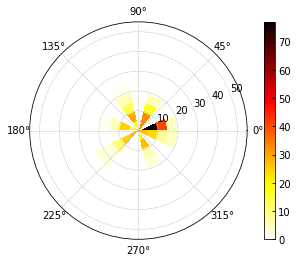

<Figure size 432x288 with 0 Axes>

In [52]:
# Using linspace so that the endpoint of 360 is included
t_bins = np.radians(np.linspace(0, 360, 15))
r_bins = np.arange(0, 60, 5)

hist, _, _ = np.histogram2d(conf_ref.historical_weather_api_hourly_df['windBearing'],
                            conf_ref.historical_weather_api_hourly_df['windSpeed'],
                            bins=(t_bins, r_bins))
tt, rr = np.meshgrid(t_bins, r_bins)

fig, ax = plt.subplots(subplot_kw=dict(projection="polar"))

pc = ax.pcolormesh(tt, rr, hist.T, cmap="hot_r")
fig.colorbar(pc)
ax.grid(True)
fig = plt.gcf()
plt.show()
plt.draw()
fig.savefig(media_directory + "\Figure" + str(figure_index) + ".png")
figure_index += 1

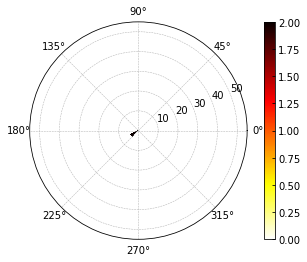

<Figure size 432x288 with 0 Axes>

In [51]:
# Using linspace so that the endpoint of 360 is included
t_bins = np.radians(np.linspace(0, 360, 15))
r_bins = np.arange(0, 60, 5)

hist, _, _ = np.histogram2d(conf_ref.weather_api_hourly_mask_df['windBearing'],
                            conf_ref.weather_api_hourly_mask_df['windSpeed'],
                            bins=(t_bins, r_bins))
tt, rr = np.meshgrid(t_bins, r_bins)

fig, ax = plt.subplots(subplot_kw=dict(projection="polar"))

pc = ax.pcolormesh(tt, rr, hist.T, cmap="hot_r")
fig.colorbar(pc)
ax.grid(True)
fig = plt.gcf()
plt.show()
plt.draw()
fig.savefig(media_directory + "\Figure" + str(figure_index) + ".png")
figure_index += 1

In [58]:
fig = px.bar_polar(conf_ref.historical_weather_api_hourly_df, r="windSpeed", theta="windBearing",
                   direction  = 'counterclockwise',
                   start_angle = 0)
fig.show()